# *Challenge 1*: A **kernel** methods / **DL** pipeline for the FashionMNIST dataset

Advanced Topics in Machine Learning -- Fall 2024, UniTS

<a target="_blank" href="https://colab.research.google.com/github/ganselmif/adv-ml-units/blob/main/notebooks/AdvML_Challenge_1.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/></a>


During this first *challenge* of the *Advanced Machine Learning Course*, you will experiment with the development of a data analysis pipeline based upon various techniques seen during the lectures so far: some **unsupervised** (*e.g.* *PCA*, *kernel-PCA*) and some others **supervised** (*e.g.* *kernel SVM* and *Artificial Neural Networks* for classification).

### The dataset

The dataset of interest for the *challenge* will be [*FashionMNIST*](https://github.com/zalandoresearch/fashion-mnist), an *MNIST*-like dataset of grayscale images of fashion items. Originally developed by Zalando Research in 2017 as a harder (yet *drop-in* compatible) replacement for the original *MNIST* dataset, it has been used in several papers and competitions since then.

Remember to consider the *dataset* mentioned below as the **training set** offered by *FashionMNIST*. Use the *test set* only at the end, to evaluate the overall accuracy of the pipeline!

### Section 1: Understanding data geometry

Load the dataset in the most suitable form for the tasks that follow. Then, perform the following steps, with the goal of developing a geometric understanding of the dataset:

1. Perform a (linear) *PCA* on the dataset, and plot the first two (or three!) principal components along with the true label. Comment on data separation.

2. Perform a *kernel-PCA* on the dataset with a Gaussian kernel, and plot the first two (or three!) principal components along with the true label. Try to tune the dispersion parameter of the kernel to obtain a good separation of the data. Comment.

3. Perform another *kernel-PCA* on the dataset with another kernel of your own choice, and plot the first two (or three!) principal components along with the true label. Try to tune the degree of the polynomial kernel to obtain a good separation of the data. Comment.

Whenever suitable, try to complement your analysis with some graphs!

**IMPORTANT NOTICE**: As some of you have reported, performing *kernel PCA* on the entire *FashionMNIST* dataset can be memory- and time- demanding (as it scales with the square of the number of datapoints!). In case you want to reduce such requirements, you can either:
  - Reduce the number of datapoints on which to perform *kPCA*, *e.g.* by slicing the randomly-shuffled dataset *(most effective!)*;
  - Reduce the size of the images in the dataset (*i.e.* by dropping even/odd rows/columns, or performing local pooling) *(somehow effective: you may want to try it if you do not have access to powerful compute, but still enjoy challenges!)*.

### Section 2: Bridging *unsupervised* and *supervised*

Choose one of the results obtained in the previous section (you should choose the one better explaining data geometry), and ignore the true labels. Then, perform the following steps:

1. Considering only the first $10$ components of the *(kernel-)PCA* and try to assign $10$ labels to the resulting datapoints. Choose the approach you deem most suitable. Comment on the results, by considering:
    
    a. How well does the label-assignment just performed reflect the true labels?

    b. Does the number of components used ($10$) reflect the actual *knee-* or *gap-* *point* of the spectrum associated to the principal components?

Whenever suitable, try to complement your analysis with some graphs!

### Section 3: (Supervised) classification

Consider the dataset composed of the original images, with the label assigned in the previous section (regardless of its actual match with the true label!). Then, define and learn a classifier that can predict the label of a new image. Specifically:

1. Learn a *kernel-SVM* on the data/label pairs. The choice of the kernel and its hyperparameters is up to your experimentation and time availability. Comment on your choices and results.

2. Learn a *fully-connected NN* on the data/label pairs. The choice of the architecture and its hyperparameters is up to your experimentation and time availability: show at least two different hyperparameter configurations, and comment on the results.

3. Learn a *CNN* on the data/label pairs. The choice of the architecture and its hyperparameters is up to your experimentation and time availability. Comment on the results with special respect to the FCN architecture.

### Section 4: Wrap-up!

Evaluate the overall accuracy of the pipeline on the *test set* of *FashionMNIST*. *I.e.* compare the predicted labels from the three classifiers built in *Section 3* with the true labels.

In order to assign a true label *name* (e.g. *trousers*, *sandal*, ...) to those determined just from *(kernel-)PCA* (that obviously carry no direct information about the subject of the picture), you can either:

i. *Cheat* and use the most abundant labels for each group of *(kernel-)PCA-labelled* datapoints.

ii. Sample a subset of datapoints from each *(kernel-)PCA-labelled* class, and assign one label by direct visual inspection. If you choose this route, it may also serve as a reminder of the fact that *expert labelling* is not always a trivial (and almost never a fast) task!

Comment on the results obtained.

### Section 5: A *fully-supervised* approach

Repeat the steps of *Section 3* using the true labels of the dataset. Comment on the results, and draw a comparison between such results and those obtained from the previous *hybrid* pipeline.


And please, avoid doing that... 👇🏻

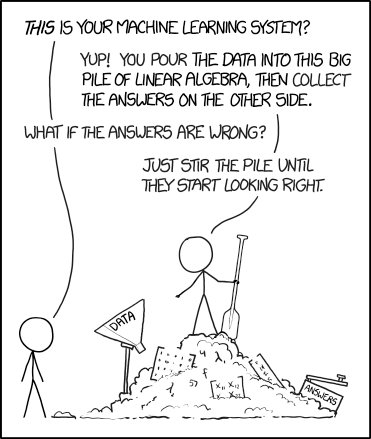

# Proposed solution

First, some useful libraries.

In [ ]:
# For general purpose
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

# For unsupervised part
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, KernelPCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.svm import SVC

#For NN part
import torch as th
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset


Now we can import the dataset and scale it accordingly

In [2]:
transform = transforms.Compose([transforms.ToTensor()])
fashion_mnist = datasets.FashionMNIST('../data', train=True, download=True, transform=transform)

data_loader = DataLoader(fashion_mnist, batch_size=len(fashion_mnist), shuffle=True)
fashion_mnist_classes = fashion_mnist.classes

del fashion_mnist

X_train_true, y_train_true = next(iter(data_loader))

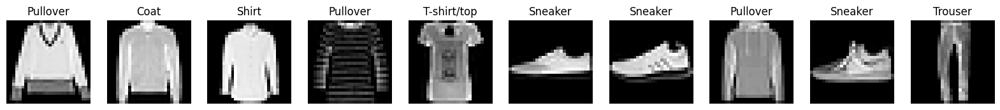

In [3]:
# Plot some examples of the labels
fig, ax = plt.subplots(1, 10, figsize=(20, 5))
for i in range(10):
	ax[i].imshow(X_train_true[i][0], cmap='gray')
	ax[i].set_title(fashion_mnist_classes[y_train_true[i].item()])
	ax[i].axis('off')
plt.show()

In [4]:
# Pass the data do numpy version
X_train_true = X_train_true.reshape(X_train_true.shape[0], -1).numpy()
y_train_true = y_train_true.numpy()

In [5]:
# Standardize the data
def standardize(X):
	X_mean = X.mean(axis=0)
	X_std = X.std(axis=0) + 1e-10 # to avoid division by zero
	X = (X - X_mean)/X_std

	X = np.where(np.isnan(X), 0, X)
	X = np.where(np.abs(X)>100, 0, X)

	return X, X_mean, X_std

X_train_scaled, X_train_mean, X_train_std = standardize(X_train_true)

# Quick check of dimensions
print(X_train_scaled.shape)
print(y_train_true.shape)

(60000, 784)
(60000,)


## Section 1

### Classical PCA

In [6]:
pca = PCA(n_components=3)

X_pca = pca.fit_transform(X_train_scaled)

# Check the explained variance ratio
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.sum())

[0.22194031 0.14486569 0.05488476]
0.42169076


In [7]:
X_pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3'])
X_pca_df['Label'] = y_train_true
X_pca_df.head()

,PC1,PC2,PC3,Label
0,14.161119,13.448442,1.876843,2
1,18.348629,9.653055,10.643685,4
2,20.717493,0.681957,-1.075032,6
3,-15.519426,-5.832306,9.337646,2
4,4.994162,-9.320526,3.461872,0


/tmp/ipykernel_10402/3699256067.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


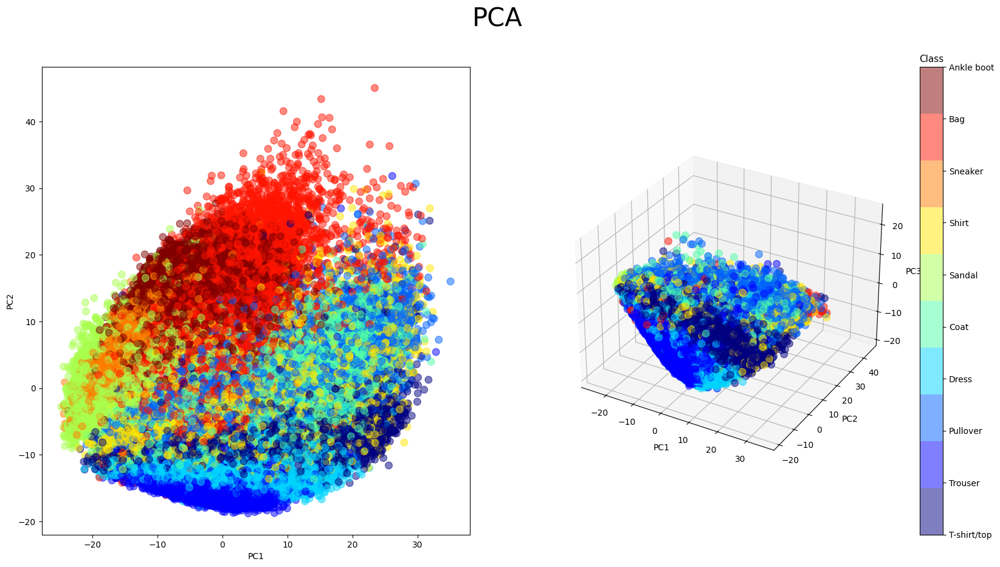

In [8]:
# Plot 2D PCA
# Create a figure for both subplots (2D and 3D)
fig = plt.figure(figsize=(20, 10))  
cmap = plt.get_cmap('jet', 10)      
fig.suptitle("PCA", fontsize=30)

# First subplot: 2D scatter plot of PC1 vs PC2
ax = fig.add_subplot(1, 2, 1)
sc = ax.scatter(X_pca_df['PC1'], X_pca_df['PC2'], 
                c=X_pca_df['Label'], cmap=cmap, s=70, alpha=0.5)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

# Second subplot: 3D scatter plot of PC1, PC2, PC3
ax = fig.add_subplot(1, 2, 2, projection='3d')
sc3d = ax.scatter(X_pca_df['PC1'], X_pca_df['PC2'], 
                  X_pca_df['PC3'], c=X_pca_df['Label'], cmap=cmap, s=70, alpha=0.5)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Add color bar to show the labels
cb = plt.colorbar(sc3d)
cb.ax.set_yticklabels(fashion_mnist_classes)
cb.ax.set_title('Class', fontsize=11)

fig.savefig('../reports/images/pca.png')
plt.show()

#### Some comments

Performing a canonical PCA, we can see that we don't obtain a meaningful data separation, as we still have a "uniform cloud" of points. We don't achieve much separation between the points, at least with these few points. This may suggest that the Fashion-MNIST dataset is characterized by complex non-linear relationships that we are not able to grasp through a "vanilla" linear PCA.

**Some observations on the single clusters**
- The *electric blue* cluster, related to Trousers is pretty distinct to the others, also in the 2D plot, which is totally reasonable as it is the only lower-body cloth, so we expect to have distinct characteristics.
- We can observe a similar behavior also in the *bright red* cluster related to the Bag class.
- We can observe that we have some partial overlap between the classes *Ankle boot*,*Sandal* and *Sneaker*, which are all types of shoes, so we expect them to be similar in terms of information carried.
- The classes related to the upper-body clothes are a lot superposed, which is again expectable as they are similar between each other.

### Kernel PCA

In [9]:
# Due to computational constraints of the Kernel PCA, we will use only a subset of the data
X_train, y_train = next(iter(data_loader))
X_train_small, _, y_train_small, _ = train_test_split(X_train, y_train, train_size=X_train.shape[0]//20, random_state=42)

X_train_small = X_train_small.reshape(X_train_small.shape[0], -1).numpy()
y_train_small = y_train_small.numpy()

X_train_scaled_small, _, _ = standardize(X_train_small)

print(X_train_scaled_small.shape)
print(y_train_small.shape)

(3000, 784)
(3000,)


In [10]:
def plot_kernel_rbf_pca(X, y, sigma):

	kpca = KernelPCA(n_components=3, kernel='rbf', gamma=sigma**(-2), fit_inverse_transform=True)
	X_kpca = kpca.fit_transform(X)

	X_kpca_df = pd.DataFrame(X_kpca, columns=['PC1', 'PC2', 'PC3'])
	X_kpca_df['Label'] = y

	fig = plt.figure(figsize=(20, 10))  
	cmap = plt.get_cmap('jet', 10)      
	fig.suptitle(f"Gaussian PCA with variance {sigma}", fontsize=30)

	# First subplot: 2D scatter plot of PC1 vs PC2
	ax = fig.add_subplot(1, 2, 1)
	sc = ax.scatter(X_kpca_df['PC1'], X_kpca_df['PC2'], 
				c=X_kpca_df['Label'], cmap=cmap, s=70, alpha=0.5)
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')

	# Second subplot: 3D scatter plot of PC1, PC2, PC3
	ax = fig.add_subplot(1, 2, 2, projection='3d')
	sc3d = ax.scatter(X_kpca_df['PC1'], X_kpca_df['PC2'], 
					X_kpca_df['PC3'], c=X_kpca_df['Label'], cmap=cmap, s=70, alpha=0.5)
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')
	ax.set_zlabel('PC3')

	# Add color bar to show the labels
	cb = plt.colorbar(sc3d)
	cb.ax.set_yticklabels(fashion_mnist_classes)
	cb.ax.set_title('Class', fontsize=11)

	plt.show()

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


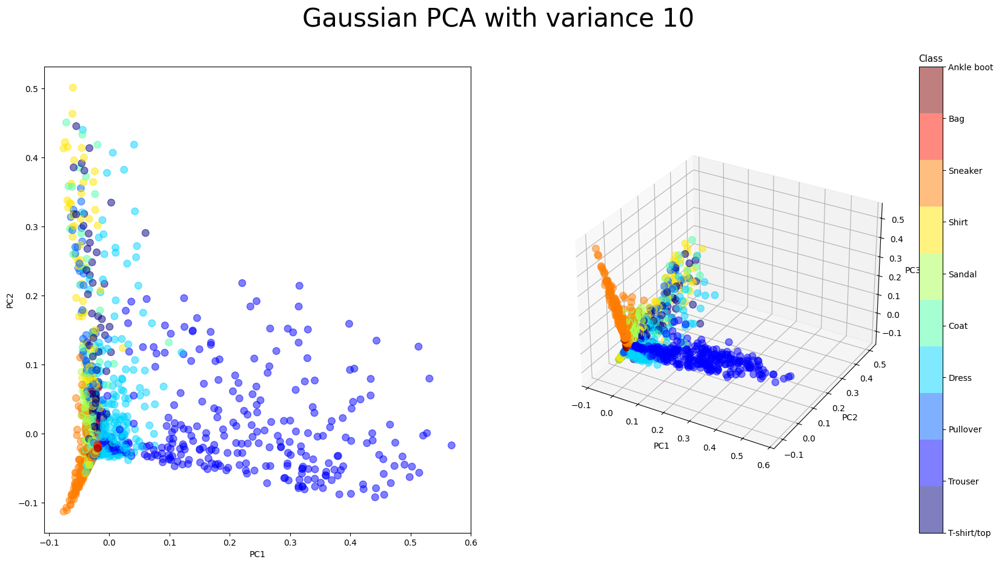

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


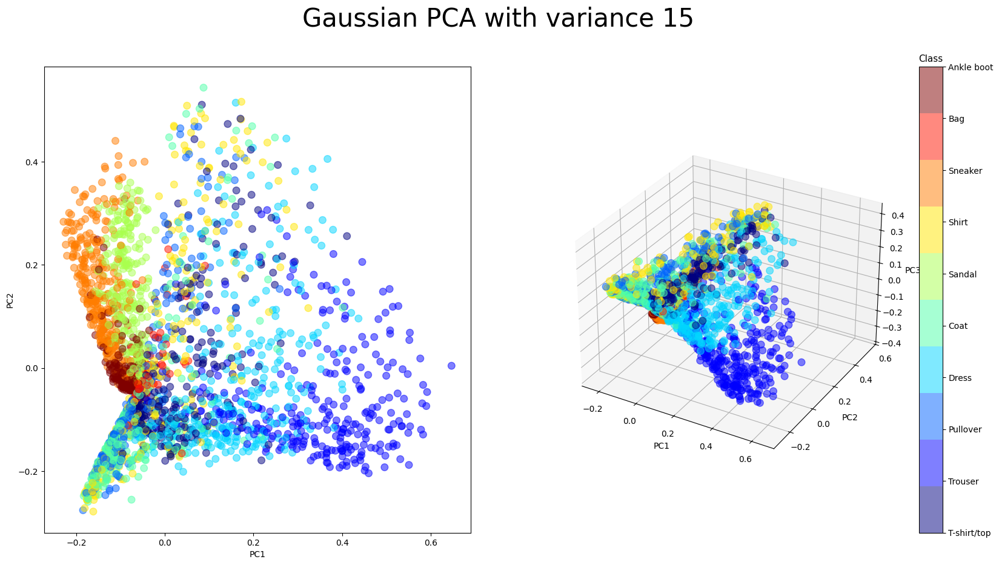

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


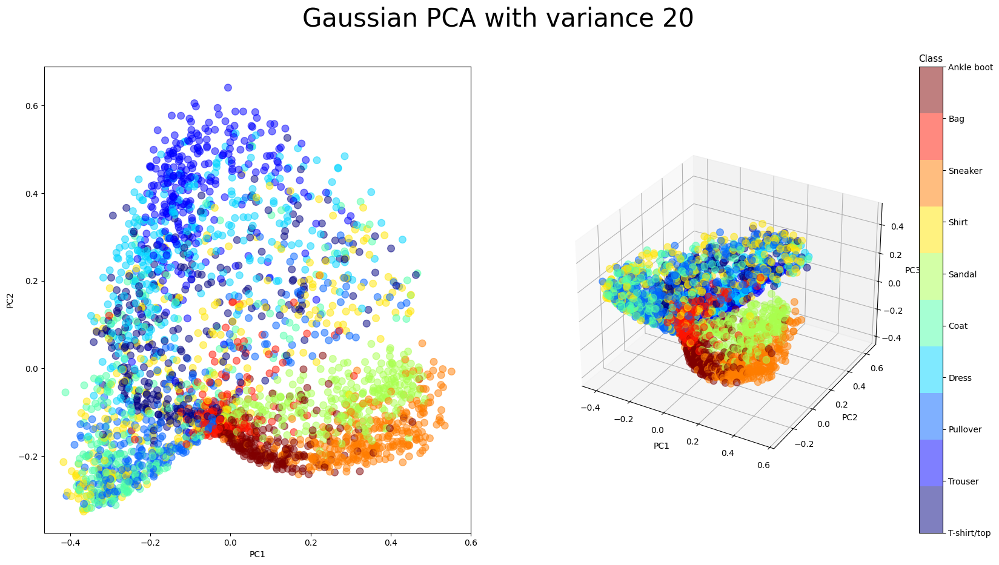

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


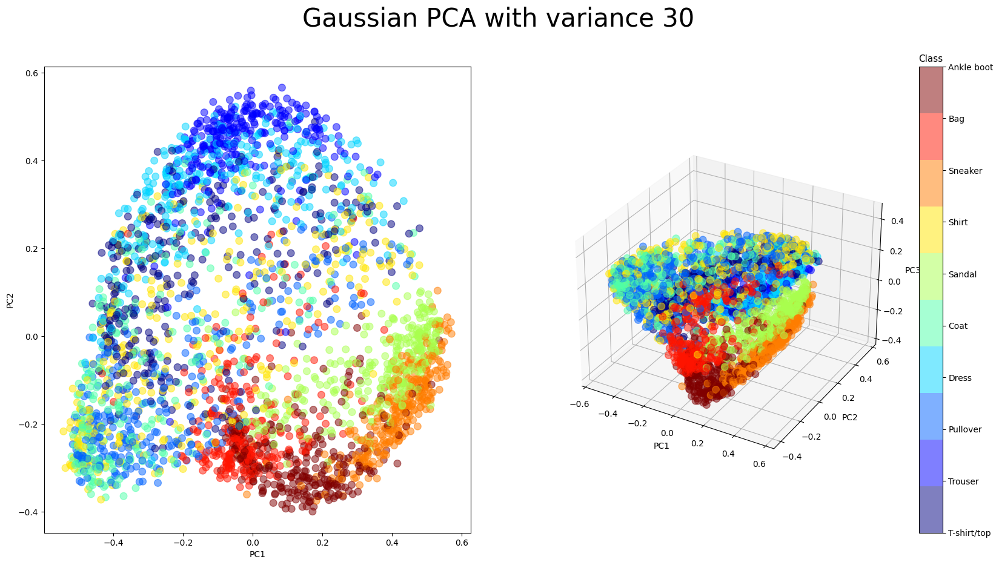

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


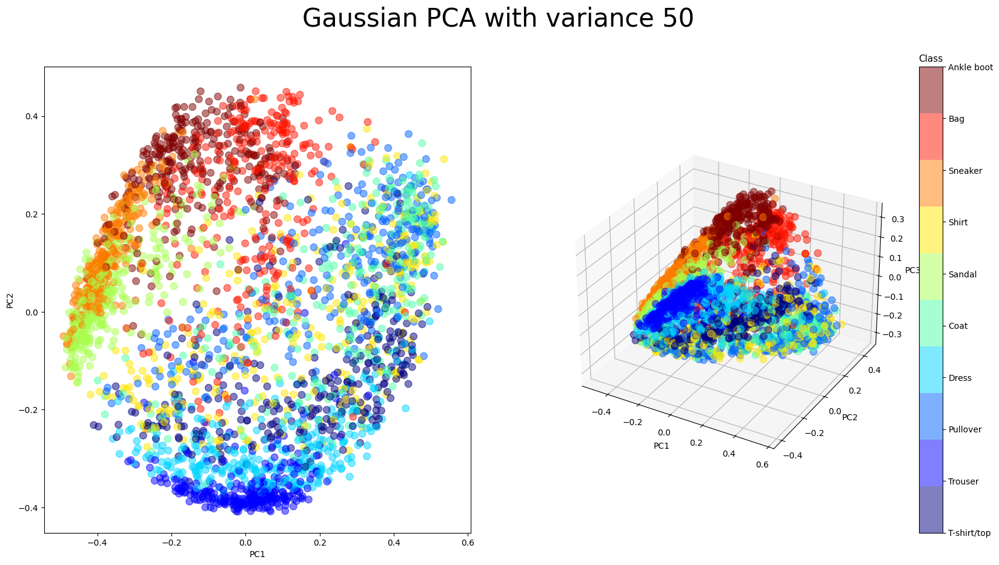

In [11]:
sigmas = [10, 15, 20, 30, 50]

for sigma in sigmas:
	plot_kernel_rbf_pca(X_train_scaled_small, y_train_small, sigma)

Only looking at the plots on the 3 principal dimensions, we can see how the hyperparameter for $\sigma$ between 20 and 30 looks the best, as in the case of $\sigma \leq 15$ we are in the regime of complete underfitting, being able to identify only one of the ten classes, while for the value $\sigma = 50$ we are in the regime of complete overfitting, resembling a similar result to the linear PCA.

Same observations about the separation of the clusters, however, hold as the case of linear PCA, where the classes related to the upper body clothes are again really close in the feature space.

Now try and apply a polynomial kernel to the data.

In [12]:
def plot_kernel_poly_pca(X, y, deg):

	kpca = KernelPCA(n_components=3, kernel='poly', degree=deg, fit_inverse_transform=True)
	X_kpca = kpca.fit_transform(X)

	X_kpca_df = pd.DataFrame(X_kpca, columns=['PC1', 'PC2', 'PC3'])
	X_kpca_df['Label'] = y

	fig = plt.figure(figsize=(20, 10))  
	cmap = plt.get_cmap('jet', 10)      
	fig.suptitle(f"Polynomial PCA with degree {deg}", fontsize=30)

	# First subplot: 2D scatter plot of PC1 vs PC2
	ax = fig.add_subplot(1, 2, 1)
	sc = ax.scatter(X_kpca_df['PC1'], X_kpca_df['PC2'], 
				c=X_kpca_df['Label'], cmap=cmap, s=70, alpha=0.5)
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')

	# Second subplot: 3D scatter plot of PC1, PC2, PC3
	ax = fig.add_subplot(1, 2, 2, projection='3d')
	sc3d = ax.scatter(X_kpca_df['PC1'], X_kpca_df['PC2'], 
					X_kpca_df['PC3'], c=X_kpca_df['Label'], cmap=cmap, s=70, alpha=0.5)
	ax.set_xlabel('PC1')
	ax.set_ylabel('PC2')
	ax.set_zlabel('PC3')

	# Add color bar to show the labels
	cb = plt.colorbar(sc3d)
	cb.ax.set_yticklabels(fashion_mnist_classes)
	cb.ax.set_title('Class', fontsize=11)

	plt.show()

/tmp/ipykernel_10402/1176871766.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


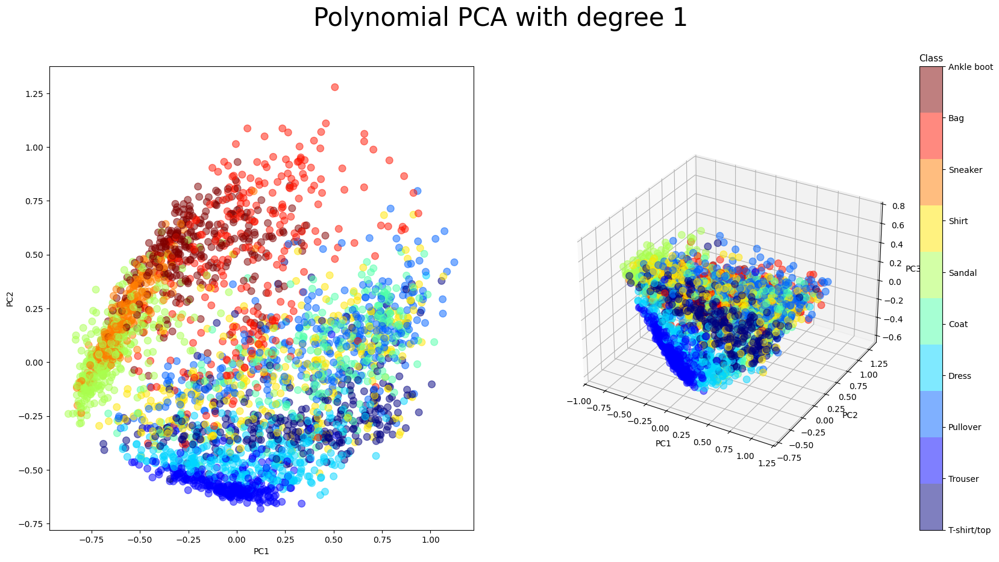

/tmp/ipykernel_10402/1176871766.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


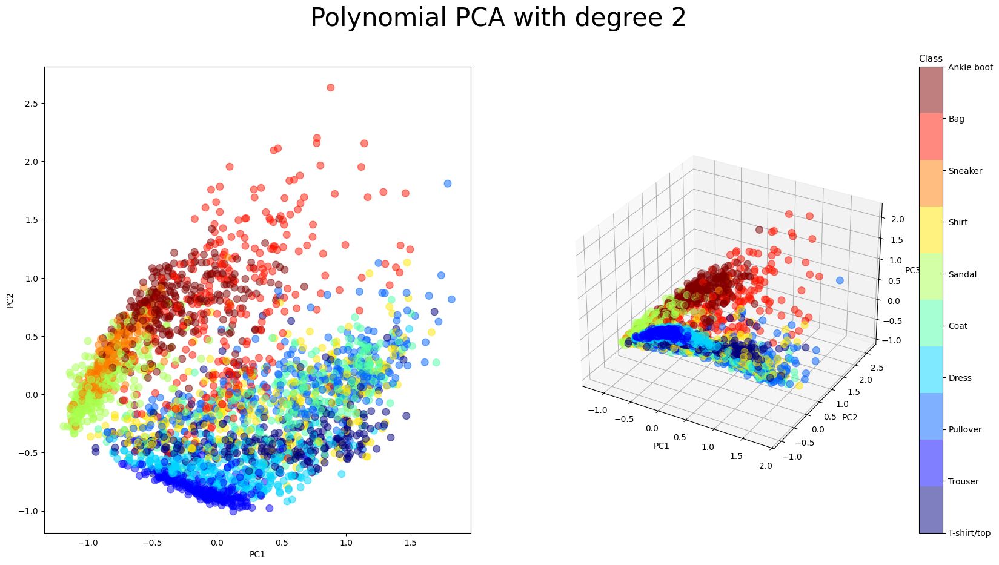

/tmp/ipykernel_10402/1176871766.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


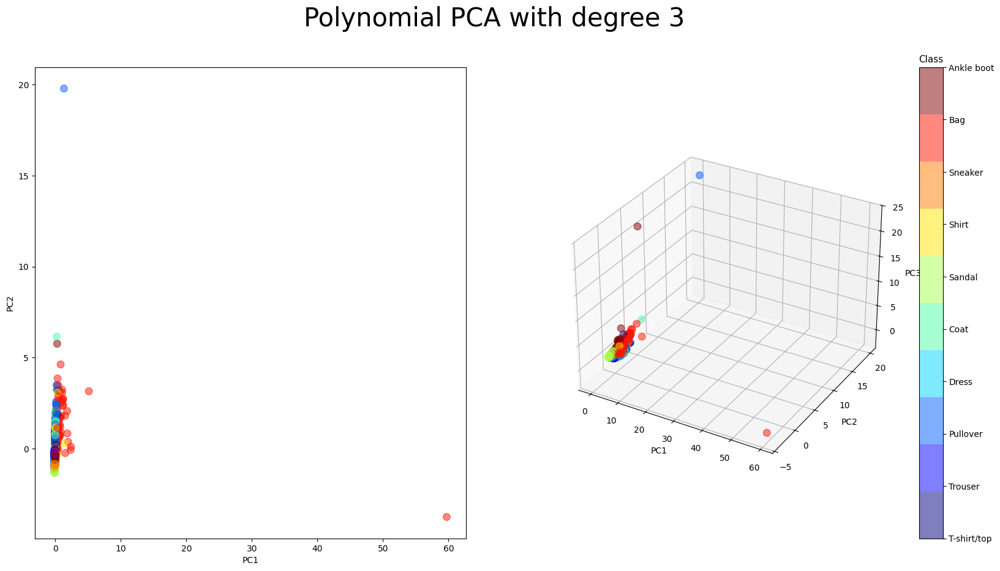

In [13]:
degs = [1, 2, 3]

for deg in degs:
	plot_kernel_poly_pca(X_train_scaled_small, y_train_small, deg)

#### Observations

We can see how Polynomial kernel is able of achieving some useful classes separation for a degree $deg = 2$. It can be observed how increasing only to a degree of 3, it makes the model completely underfit data, not being able to accurately separate the different classes.

Some important notes:
- This type of kernel explodes as soon as we hit degree 3, a try on normalizing the dataset with respect to the dimensionality of the dataset can be done, as by definition this kernel is strongly dependent from the preparation of the data.
- Again we are able to separate the data only on high-level features, meaning separating the classes of shoe-like objects, from the class of the trousers and from the upper-body clothes. This may mean that the data can't be separated with these few features, and characterizing features lie in higher dimensions.

Given the observations above, we can try and normalize the dataset also on the dimensionality of the data.

In [14]:
def standardize_dim(X):
	X_mean = X.mean(axis=0)
	X_std = X.std(axis=0) + 1e-10 # to avoid division by zero
	X = (X - X_mean)/X_std

	X = np.where(np.isnan(X), 0, X)
	X = np.where(np.abs(X)>100, 0, X)

	return X/np.sqrt(X.shape[1]), X_mean, X_std

X_train_scaled_small_dim, _, _ = standardize_dim(X_train_small)

print(X_train_scaled_small_dim.shape)
print(y_train_small.shape)

(3000, 784)
(3000,)


/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


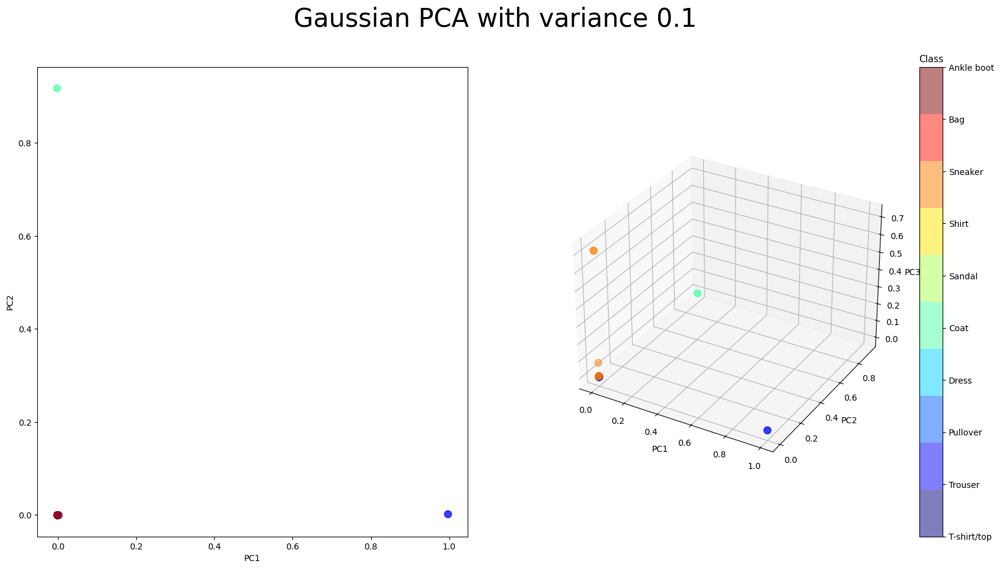

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


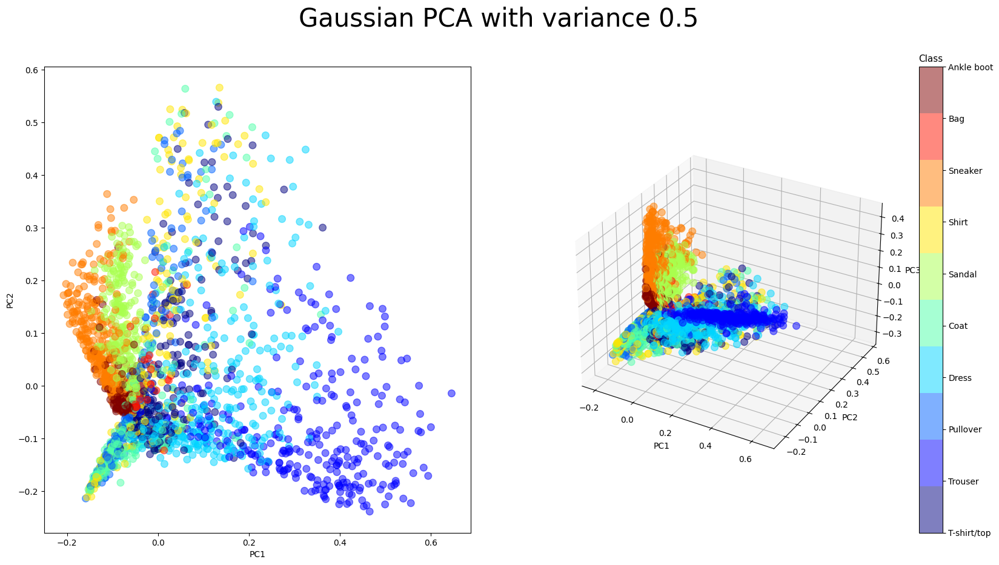

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


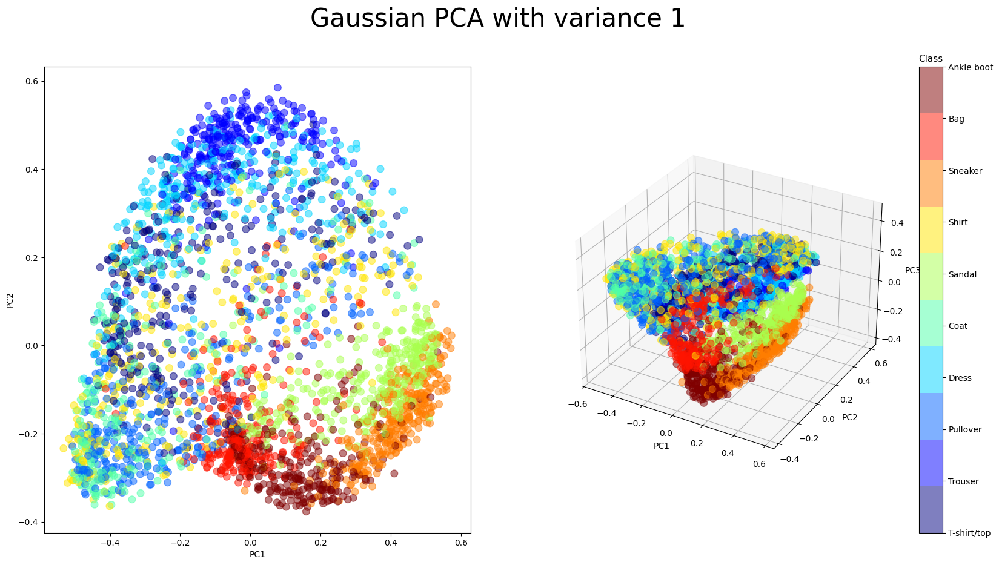

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


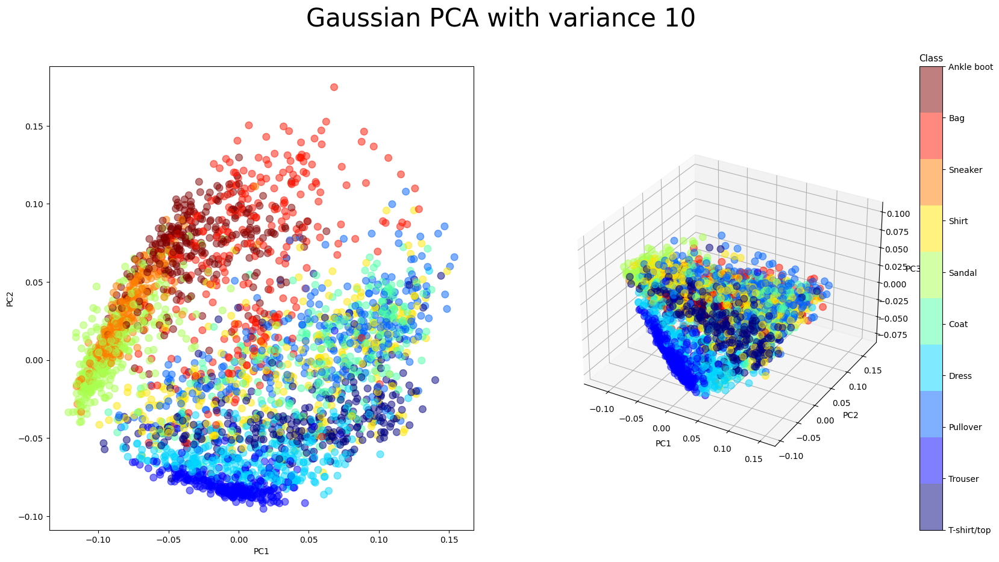

/tmp/ipykernel_10402/1585173147.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


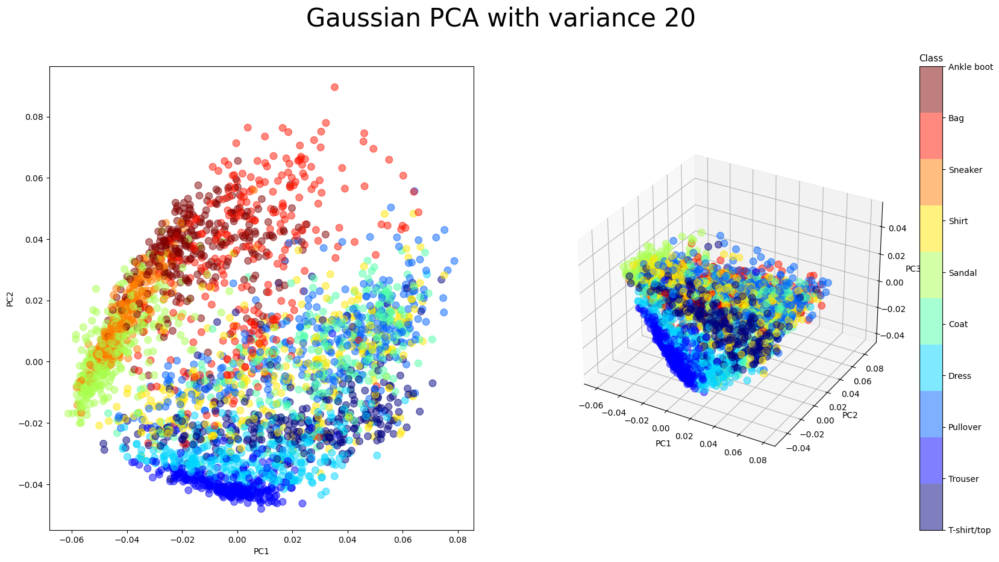

In [15]:
sigmas = [0.1, 0.5, 1, 10, 20]

for sigma in sigmas:
	plot_kernel_rbf_pca(X_train_scaled_small_dim, y_train_small, sigma)

/tmp/ipykernel_10402/1176871766.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


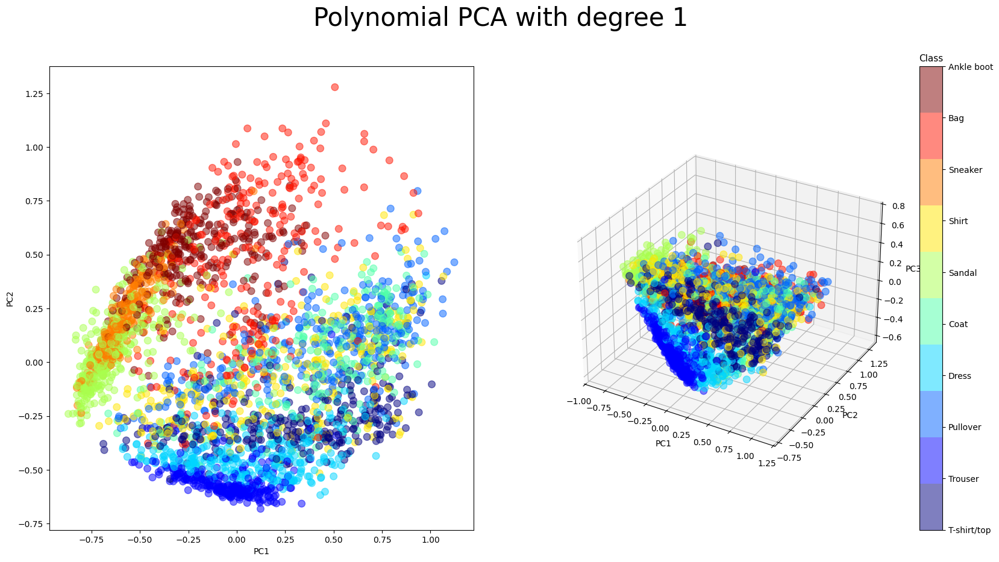

/tmp/ipykernel_10402/1176871766.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


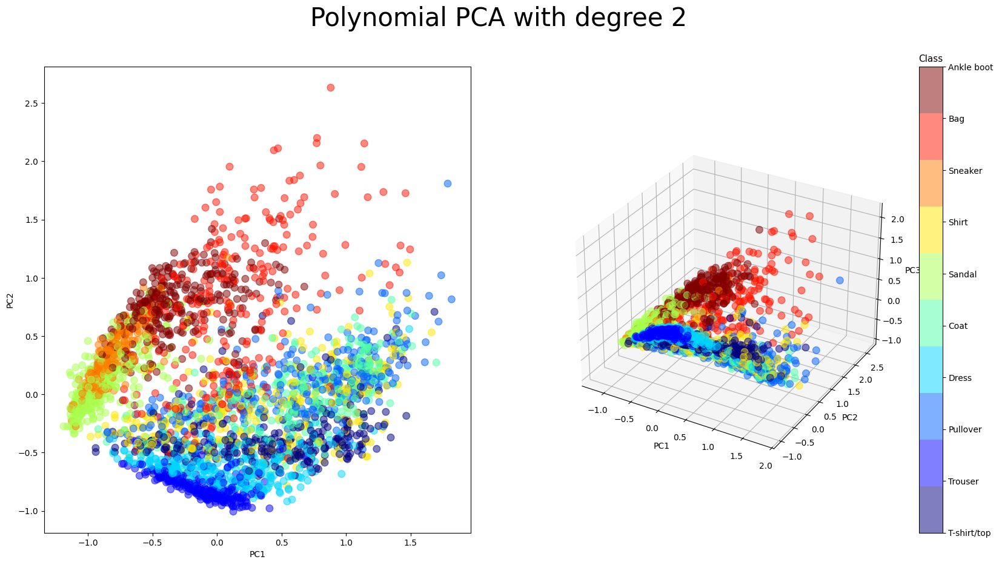

/tmp/ipykernel_10402/1176871766.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


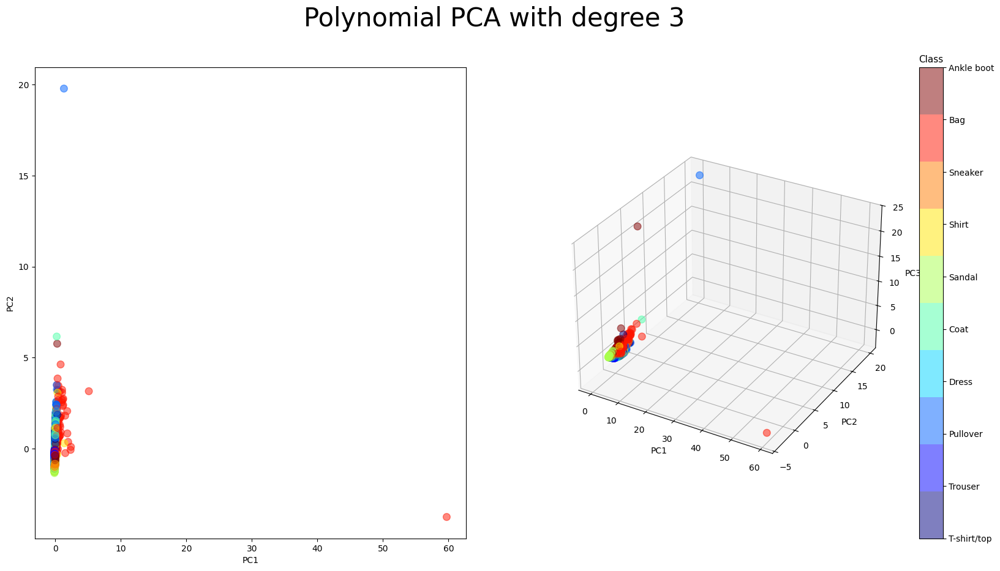

In [16]:
degs = [1, 2, 3]

for deg in degs:
	plot_kernel_poly_pca(X_train_scaled_small, y_train_small, deg)

We can observe how scaling the data on the dimensionality of the dataset the Polynomial kernel performs slightly better, but we can see how going for higher values of the degree doesn't add any meaningful separation between the classes. The plots are far more interpretable, but we can see how the degree $deg = 2$ is again the best hyperparameter in this case.

Regarding the variance parameter for the Gaussian Kernel PCA, we can see how the order of magnitude is completely different, as expected, and now a value of $\sigma = 1$ works pretty well.

/tmp/ipykernel_10402/4020198697.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cb.ax.set_yticklabels(fashion_mnist_classes)


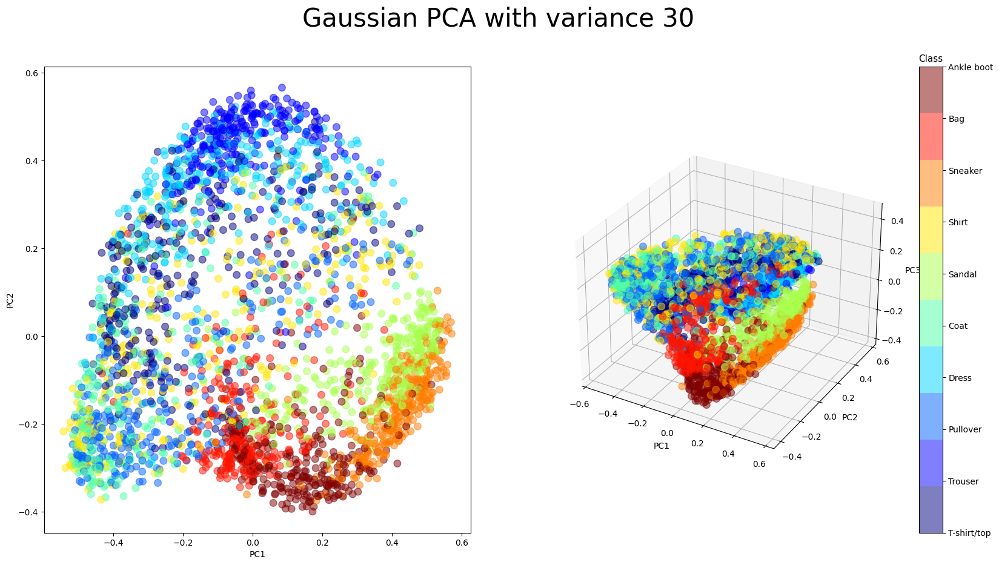

In [17]:
# Just to save the figure
sigma = 30

kpca = KernelPCA(n_components=3, kernel='rbf', gamma=sigma**(-2), fit_inverse_transform=True)
X_kpca = kpca.fit_transform(X_train_scaled_small)

X_kpca_df = pd.DataFrame(X_kpca, columns=['PC1', 'PC2', 'PC3'])
X_kpca_df['Label'] = y_train_small

fig = plt.figure(figsize=(20, 10))  
cmap = plt.get_cmap('jet', 10)      
fig.suptitle(f"Gaussian PCA with variance {sigma}", fontsize=30)

# First subplot: 2D scatter plot of PC1 vs PC2
ax = fig.add_subplot(1, 2, 1)
sc = ax.scatter(X_kpca_df['PC1'], X_kpca_df['PC2'], 
			c=X_kpca_df['Label'], cmap=cmap, s=70, alpha=0.5)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

# Second subplot: 3D scatter plot of PC1, PC2, PC3
ax = fig.add_subplot(1, 2, 2, projection='3d')
sc3d = ax.scatter(X_kpca_df['PC1'], X_kpca_df['PC2'], 
				X_kpca_df['PC3'], c=X_kpca_df['Label'], cmap=cmap, s=70, alpha=0.5)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Add color bar to show the labels
cb = plt.colorbar(sc3d)
cb.ax.set_yticklabels(fashion_mnist_classes)
cb.ax.set_title('Class', fontsize=11)

fig.savefig('../reports/images/kernel_pca.png')
plt.show()

## Section 2

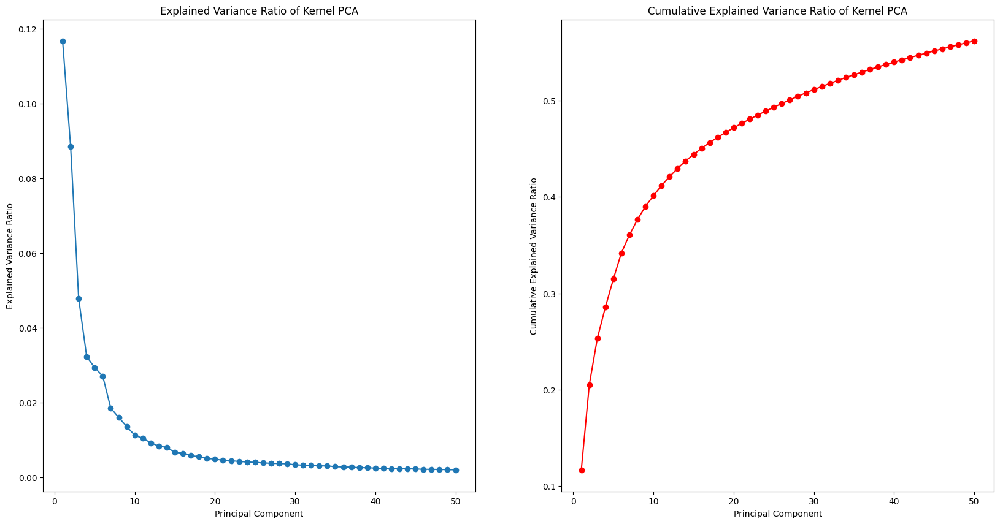

In [18]:
kpca = KernelPCA(kernel='rbf', gamma=30**(-2), fit_inverse_transform=True)
X_kpca = kpca.fit_transform(X_train_scaled_small)

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(121)
ax.plot(range(1, 51), kpca.eigenvalues_[:50]/kpca.eigenvalues_.sum(), 'o-')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance Ratio')
ax.set_title('Explained Variance Ratio of Kernel PCA')

ax = fig.add_subplot(122)
ax.plot(range(1,51), np.cumsum(kpca.eigenvalues_)[:50]/kpca.eigenvalues_.sum(), 'o-', color='red')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Cumulative Explained Variance Ratio')
ax.set_title('Cumulative Explained Variance Ratio of Kernel PCA')

fig.savefig('../reports/images/kpca_spectrum.png')
plt.show()

Looking alone at the proportion of explained variance of the kernel PCA, we can observe how, looking only for a knee in the plot of the explained variance ratio, we can see how a number of components of 10 seem to do the job.

However, deciding to keep all of the 10 components, we can see how the cumulatice explained variance is about 40%, so we can expect a not perfect division of the classes.

In order to assign 10 labels to the transformed datapoints, we can adopt a simple clustering technique, like K-Means.

In [19]:
kpca = KernelPCA(n_components=10, kernel='rbf', gamma=30**(-2), fit_inverse_transform=True)
X_kpca = kpca.fit_transform(X_train_scaled_small)

kmeans = KMeans(n_clusters=10, random_state=0)
predicted_labels = kmeans.fit_predict(X_kpca)

In order to better inspect the various classes, we can simply check for the distribution of true labels for each cluster.

/tmp/ipykernel_10402/1836462172.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df_grouped.columns, rotation=45)
/tmp/ipykernel_10402/1836462172.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df_grouped.columns, rotation=45)
/tmp/ipykernel_10402/1836462172.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df_grouped.columns, rotation=45)
/tmp/ipykernel_10402/1836462172.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df_grouped.columns, rotation=45)
/tmp/ipykernel_10402/1836462172.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of tick

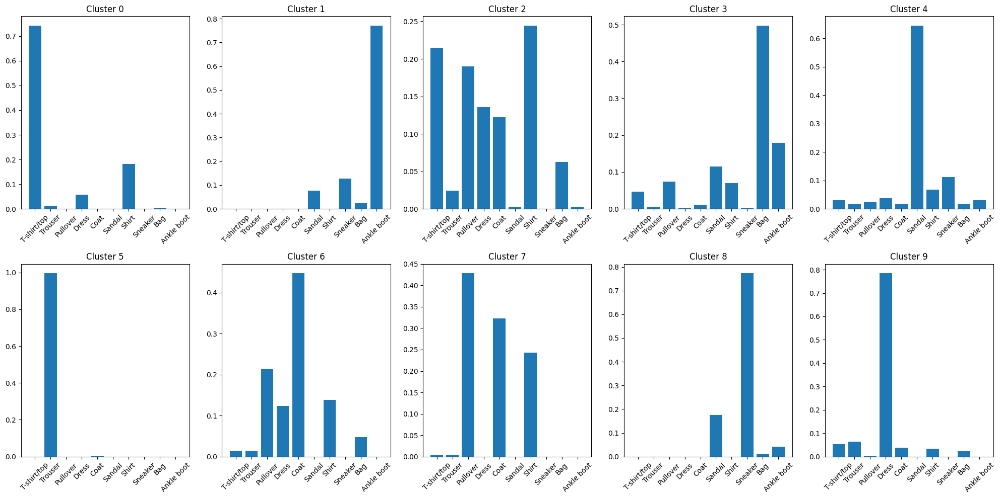

In [20]:
# Count the distribution of labels in each cluster
df = pd.DataFrame({'True': y_train_small, 'Predicted': predicted_labels})

df['Count'] = 1
df_grouped = df.groupby(['Predicted', 'True']).count().reset_index()
df_grouped = df_grouped.pivot(index='Predicted', columns='True', values='Count').fillna(0)
df_grouped = df_grouped.div(df_grouped.sum(axis=1), axis=0)
df_grouped.columns = fashion_mnist_classes

fig = plt.figure(figsize=(20, 10))
for i in range(10):
	ax = fig.add_subplot(2, 5, i+1)
	ax.bar(df_grouped.columns, df_grouped.loc[i])
	ax.set_xticklabels(df_grouped.columns, rotation=45)
	ax.set_title(f'Cluster {i}')
plt.tight_layout()
fig.savefig('../reports/images/kmeans.png')
plt.show()

#### Some obsrvations

As we can see, the 10 clusters work pretty well, as they are able to separate pretty consistently all the labels. As shown in the barplots, the class that is possible to perfectly separate from the others is the one relative to the *Trousers*, while for all the others we can observe some consistent separation.

Some peculiar attention has to be given to the cluster n° 2, in which we can observe several classes that exhibits higher presence. As observed in all the points above, we can see how all the predominant classes resemble upper-body classes, so we can expect that perfectly separating them may require some more components, as the diversification may reside in even-higher level features.

## Section 3

### Kernel-SVM

In [21]:
X_train_svm = X_train_scaled_small
y_train_svm = predicted_labels

X_train_svm, X_val_svm, y_train_svm, y_val_svm = train_test_split(X_train_svm, y_train_svm, test_size=0.2, random_state=42)

In [22]:
def train_svm(X_train, y_train, X_val, y_val, kernel='rbf', C=1.0, **kwargs):
    svm = SVC(kernel=kernel, C=C, **kwargs)
    svm.fit(X_train, y_train)
    accuracy_train = svm.score(X_train, y_train)
    y_pred = svm.predict(X_val)
    acc_value = accuracy_score(y_val, y_pred)
    return svm, accuracy_train, acc_value


kernels = ['rbf', 'poly', 'sigmoid']
sigma_values = [10, 20, 25, 30, 35]
gamma_values = [0.01, 0.1, 1, 10]
degree_values = [1, 2, 3, 4]
coef0_values = [0.1, 1, 10]  # Common for poly and sigmoid

best_accuracy = 0
best_model = None

for kernel in kernels:
    if kernel == 'rbf':
        for sigma in sigma_values:
            svm, accuracy_train, accuracy_val = train_svm(X_train= X_train_svm, y_train=y_train_svm, 
                                                          X_val=X_val_svm, y_val=y_val_svm,
                                                          kernel=kernel, gamma=sigma**(-2))
            print(f"Kernel: {kernel}, Sigma: {sigma}, Accuracy Train: {accuracy_train:.4f}, Accuracy Val: {accuracy_val:.4f}")
            if accuracy_val > best_accuracy:
                best_accuracy = accuracy_val
                best_model = svm

    elif kernel == 'poly':
        for degree in degree_values:
            for coef0 in coef0_values:
                svm, accuracy_train, accuracy_val = train_svm(X_train= X_train_svm, y_train=y_train_svm, 
															  X_val=X_val_svm, y_val=y_val_svm,
															  kernel=kernel, degree=degree, coef0=coef0, gamma='scale')
                print(f"Kernel: {kernel}, degree: {degree} coef0: {coef0}, Accuracy Train: {accuracy_train:.4f}, Accuracy Val: {accuracy_val:.4f}")
                if accuracy_val > best_accuracy:
                    best_accuracy = accuracy_val
                    best_model = svm
                
    elif kernel == 'sigmoid':
        for gamma in gamma_values:
            for coef0 in coef0_values:
                svm, accuracy_train, accuracy_val = train_svm(X_train= X_train_svm, y_train=y_train_svm, 
															  X_val=X_val_svm, y_val=y_val_svm,
															  kernel=kernel, coef0=coef0, gamma=gamma)
                print(f"Kernel: {kernel}, Gamma: {gamma}, coef0: {coef0}, Accuracy Train: {accuracy_train:.4f}, Accuracy Val: {accuracy_val:.4f}")
                if accuracy_val > best_accuracy:
                    best_accuracy = accuracy_val
                    best_model = svm

Kernel: rbf, Sigma: 10, Accuracy Train: 1.0000, Accuracy Val: 0.7583
Kernel: rbf, Sigma: 20, Accuracy Train: 0.9975, Accuracy Val: 0.9467
Kernel: rbf, Sigma: 25, Accuracy Train: 0.9933, Accuracy Val: 0.9483
Kernel: rbf, Sigma: 30, Accuracy Train: 0.9888, Accuracy Val: 0.9467
Kernel: rbf, Sigma: 35, Accuracy Train: 0.9854, Accuracy Val: 0.9433
Kernel: poly, degree: 1 coef0: 0.1, Accuracy Train: 0.9704, Accuracy Val: 0.9317
Kernel: poly, degree: 1 coef0: 1, Accuracy Train: 0.9704, Accuracy Val: 0.9317
Kernel: poly, degree: 1 coef0: 10, Accuracy Train: 0.9704, Accuracy Val: 0.9317
Kernel: poly, degree: 2 coef0: 0.1, Accuracy Train: 0.9846, Accuracy Val: 0.9300
Kernel: poly, degree: 2 coef0: 1, Accuracy Train: 0.9950, Accuracy Val: 0.9300
Kernel: poly, degree: 2 coef0: 10, Accuracy Train: 1.0000, Accuracy Val: 0.9200
Kernel: poly, degree: 3 coef0: 0.1, Accuracy Train: 0.9762, Accuracy Val: 0.9050
Kernel: poly, degree: 3 coef0: 1, Accuracy Train: 1.0000, Accuracy Val: 0.9267
Kernel: poly, d

At the end of this endless for loop, we have a winner!

In [23]:
print(f"Best model: {best_model}, {best_model.kernel} kernel, Best accuracy on validation: {best_accuracy:.4f}")

Best model: SVC(gamma=0.0016), rbf kernel, Best accuracy on validation: 0.9483


We can see that on this validation set, the best model in terms of validation accuracy results to be the one using gaussian kernel with a parameter of variance $\sigma = 25$, achieving an accuracy of 95%.

### Fully Connected NN

In [24]:
# Model definition
class FCNN(nn.Module):
	def __init__(self, hidden_size, hidden_layers):
		super(FCNN, self).__init__()
		self.net = nn.Sequential(
			nn.Linear(784, hidden_size),
			nn.ReLU(),
			*[nn.Sequential(nn.Linear(hidden_size, hidden_size), nn.ReLU()) for _ in range(hidden_layers-1)],
			nn.Linear(hidden_size, 10)
		)

	def forward(self, x):
		return self.net(x)
	
	
# Training function
def train_model(model, train_loader, eval_loader, epochs=20, lr=1e-3, device='cpu'):
	criterion = nn.CrossEntropyLoss()
	optimizer = optim.Adam(model.parameters(), lr=lr)
	train_losses = []
	val_losses = []

	for epoch in range(epochs):

		# Training
		model.train()
		running_loss = 0.0
		correct = 0
		total = 0

		for i, (X_batch, y_batch) in enumerate(train_loader):
			X_batch, y_batch = X_batch.to(device), y_batch.to(device)

			optimizer.zero_grad()

			output = model(X_batch)
			loss = criterion(output, y_batch)
			loss.backward()
			optimizer.step()

			running_loss += loss.item()

			_, predicted = th.max(output.data, 1)
			total += y_batch.size(0)
			correct += (predicted == y_batch).sum().item()
			
		train_losses.append(loss.item())
		
		train_accuracy = correct/total

		correct = 0
		total = 0

		# Evaluation
		model.eval()

		with th.no_grad():
			for i, (X_batch, y_batch) in enumerate(eval_loader):
				X_batch, y_batch = X_batch.to(device), y_batch.to(device)

				output = model(X_batch)
				loss = criterion(output, y_batch)

				_, predicted = th.max(output.data, 1)
				total += y_batch.size(0)
				correct += (predicted == y_batch).sum().item()
		
		val_losses.append(loss.item())

		val_accuracy = correct/total
			

		print(f"Epoch {epoch+1}, Training Loss: {running_loss}, Training Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}")

	return model, train_accuracy, val_accuracy, train_losses, val_losses

In [25]:
X_train_nn = th.tensor(np.array(X_train_svm)).float()
y_train_nn = th.tensor(np.array(y_train_svm)).long()
X_val_nn = th.tensor(np.array(X_val_svm)).float()
y_val_nn = th.tensor(np.array(y_val_svm)).long()

train_dataset = TensorDataset(X_train_nn, y_train_nn)
val_dataset = TensorDataset(X_val_nn, y_val_nn)

DEVICE = 'cuda' if th.cuda.is_available() else 'cpu'
BATCH_SIZE = 64
INPUT_SIZE = 784
OUTPUT_SIZE = 10

nn_train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
nn_val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)	

nn1 = FCNN(hidden_size=128, hidden_layers=2).to(DEVICE)
nn2 = FCNN(hidden_size=256, hidden_layers=2).to(DEVICE)

print("\nTraining FCNN 1")
nn1, train_accuracy_1, val_accuracy_1, train_losses_1, val_losses_1 = train_model(nn1, nn_train_loader, nn_val_loader, lr=1e-3, device=DEVICE)

print("\nTraining FCNN 2")
nn2, train_accuracy_2, val_accuracy_2, train_losses_2, val_losses_2 = train_model(nn2, nn_train_loader, nn_val_loader, lr=5e-4, device=DEVICE)


Training FCNN 1
Epoch 1, Training Loss: 29.477054372429848, Training Accuracy: 0.7750, Validation Accuracy: 0.8967
Epoch 2, Training Loss: 6.84435410797596, Training Accuracy: 0.9371, Validation Accuracy: 0.9367
Epoch 3, Training Loss: 4.720377169549465, Training Accuracy: 0.9554, Validation Accuracy: 0.9350
Epoch 4, Training Loss: 3.9282588437199593, Training Accuracy: 0.9629, Validation Accuracy: 0.9250
Epoch 5, Training Loss: 2.2810608707368374, Training Accuracy: 0.9842, Validation Accuracy: 0.9300
Epoch 6, Training Loss: 1.86763128452003, Training Accuracy: 0.9867, Validation Accuracy: 0.9283
Epoch 7, Training Loss: 1.5144875310361385, Training Accuracy: 0.9896, Validation Accuracy: 0.9317
Epoch 8, Training Loss: 1.1271735215559602, Training Accuracy: 0.9933, Validation Accuracy: 0.9417
Epoch 9, Training Loss: 0.9181523905135691, Training Accuracy: 0.9938, Validation Accuracy: 0.9383
Epoch 10, Training Loss: 0.6110914626624435, Training Accuracy: 0.9958, Validation Accuracy: 0.93

### Convolutional Neural Network

In [26]:
class CNN(nn.Module):
    
	def __init__(self):
		super(CNN, self).__init__()
		self.net = nn.Sequential(
			nn.Conv2d(1, 32, kernel_size=3, padding=1),
			nn.ReLU(),
			nn.MaxPool2d(2),
			nn.Conv2d(32, 64, kernel_size=3, padding=1),
			nn.ReLU(),
			nn.MaxPool2d(2),
			nn.Flatten(),
			nn.Linear(64*7*7, 128),
			nn.ReLU(),
			nn.Linear(128, 10)
		)

	def forward(self, x):
		x = x.view(-1, 1, 28, 28)
		return self.net(x)

In [27]:
cnn = CNN().to(DEVICE)

print("\nTraining CNN")
cnn, train_accuracy_cnn, val_accuracy_cnn, train_losses_cnn, val_losses_cnn = train_model(cnn, nn_train_loader, nn_val_loader, lr=1e-3, device=DEVICE)

print("\n\n Final accuracies on validation set")
print("FCNN 1: ", val_accuracy_1)
print("FCNN 2: ", val_accuracy_2)
print("CNN: ", val_accuracy_cnn)



Training CNN
Epoch 1, Training Loss: 25.74727936089039, Training Accuracy: 0.7692, Validation Accuracy: 0.9017
Epoch 2, Training Loss: 7.743869125843048, Training Accuracy: 0.9258, Validation Accuracy: 0.9183
Epoch 3, Training Loss: 6.564695756882429, Training Accuracy: 0.9300, Validation Accuracy: 0.9000
Epoch 4, Training Loss: 6.022379174828529, Training Accuracy: 0.9404, Validation Accuracy: 0.9217
Epoch 5, Training Loss: 4.706708751618862, Training Accuracy: 0.9529, Validation Accuracy: 0.9183
Epoch 6, Training Loss: 4.884303811937571, Training Accuracy: 0.9525, Validation Accuracy: 0.9317
Epoch 7, Training Loss: 4.083577290177345, Training Accuracy: 0.9533, Validation Accuracy: 0.9317
Epoch 8, Training Loss: 2.501798109151423, Training Accuracy: 0.9783, Validation Accuracy: 0.9217
Epoch 9, Training Loss: 2.7605513678863645, Training Accuracy: 0.9746, Validation Accuracy: 0.9250
Epoch 10, Training Loss: 2.4352667219936848, Training Accuracy: 0.9779, Validation Accuracy: 0.9250
Epo

We can observe how in this case how kernel-SVM and Neural Networks perform in similar way in terms of validation accuracy. This phenomenon may be due to the fact that adding fuzzying regularization or even simmetries (using a CNN archietecture), NNs result good for a great amount of data. In this case, using a Neural Network doesn't bring much advantage in terms of validation accuracy.

However, to have a fairer result, a k-Fold Cross Validation, or similar technique havo to be applied.

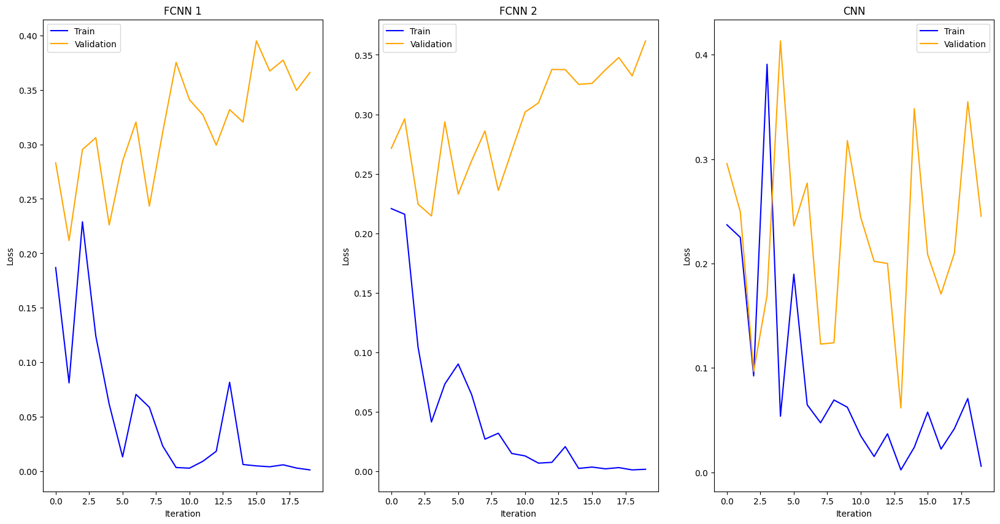

In [28]:
# Plot the training and validation losses for all the models

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1)
ax.plot(train_losses_1, label='Train', color='blue')
ax.plot(val_losses_1, label='Validation', color='orange')
ax.set_title('FCNN 1')
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.legend()

ax = fig.add_subplot(1, 3, 2)	
ax.plot(train_losses_2, label='Train', color='blue')
ax.plot(val_losses_2, label='Validation', color='orange')
ax.set_title('FCNN 2')
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.legend()

ax = fig.add_subplot(1, 3, 3)
ax.plot(train_losses_cnn, label='Train', color='blue')
ax.plot(val_losses_cnn, label='Validation', color='orange')
ax.set_title('CNN')
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.legend()

plt.show()

To have a better view if the model goes to overfitting regime, we can ry and visualize the loss behavior in a higher number of epochs.

In [29]:
nn1 = FCNN(hidden_size=128, hidden_layers=2).to(DEVICE)
nn2 = FCNN(hidden_size=256, hidden_layers=2).to(DEVICE)
cnn = CNN().to(DEVICE)

print("\nTraining FCNN 1")
nn1, train_accuracy_1, val_accuracy_1, train_losses_1, val_losses_1 = train_model(nn1, nn_train_loader, nn_val_loader, lr=1e-3, epochs=100, device=DEVICE)

print("\nTraining FCNN 2")
nn2, train_accuracy_2, val_accuracy_2, train_losses_2, val_losses_2 = train_model(nn2, nn_train_loader, nn_val_loader, lr=5e-4, epochs=100, device=DEVICE)

print("\nTraining CNN")
cnn, train_accuracy_cnn, val_accuracy_cnn, train_losses_cnn, val_losses_cnn = train_model(cnn, nn_train_loader, nn_val_loader, lr=1e-3, epochs=100, device=DEVICE)

print("\n\n Final accuracies on test set")
print("FCNN 1: ", val_accuracy_1)
print("FCNN 2: ", val_accuracy_2)
print("CNN: ", val_accuracy_cnn)


Training FCNN 1
Epoch 1, Training Loss: 27.837335154414177, Training Accuracy: 0.8213, Validation Accuracy: 0.9083
Epoch 2, Training Loss: 6.435192666947842, Training Accuracy: 0.9375, Validation Accuracy: 0.9333
Epoch 3, Training Loss: 4.105731006711721, Training Accuracy: 0.9650, Validation Accuracy: 0.9450
Epoch 4, Training Loss: 3.128658389672637, Training Accuracy: 0.9746, Validation Accuracy: 0.9267
Epoch 5, Training Loss: 2.4991346318274736, Training Accuracy: 0.9796, Validation Accuracy: 0.9317
Epoch 6, Training Loss: 2.1926548685878515, Training Accuracy: 0.9804, Validation Accuracy: 0.9367
Epoch 7, Training Loss: 1.8174741249531507, Training Accuracy: 0.9817, Validation Accuracy: 0.9383
Epoch 8, Training Loss: 1.0987456599250436, Training Accuracy: 0.9929, Validation Accuracy: 0.9383
Epoch 9, Training Loss: 0.7363573429174721, Training Accuracy: 0.9962, Validation Accuracy: 0.9383
Epoch 10, Training Loss: 0.674448314588517, Training Accuracy: 0.9967, Validation Accuracy: 0.9

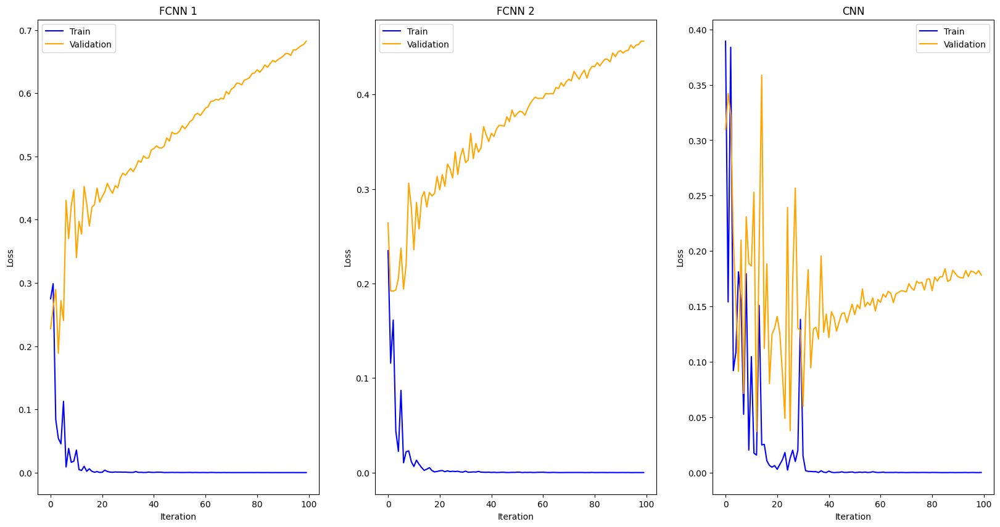

In [30]:
# Plot the training and validation losses for all the models

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1)
ax.plot(train_losses_1, label='Train', color='blue')
ax.plot(val_losses_1, label='Validation', color='orange')
ax.set_title('FCNN 1')
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.legend()

ax = fig.add_subplot(1, 3, 2)
ax.plot(train_losses_2, label='Train', color='blue')
ax.plot(val_losses_2, label='Validation', color='orange')
ax.set_title('FCNN 2')
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.legend()

ax = fig.add_subplot(1, 3, 3)
ax.plot(train_losses_cnn, label='Train', color='blue')
ax.plot(val_losses_cnn, label='Validation', color='orange')
ax.set_title('CNN')
ax.set_xlabel('Iteration')
ax.set_ylabel('Loss')
ax.legend()

plt.show()

Training on a higher number of epochs, we can see how the model still reaches convergence, but incurring in overfitting. This may be due to the very few number of datapoints used and to the huge parametrization employed. Still in this regime, the kernel-SVM works better, considered its complexity.

## Section 4

First of all, create a test set.

In [31]:
fashion_mnist = datasets.FashionMNIST('../data', train=False, download=True, transform=transform)
test_loader = DataLoader(fashion_mnist, batch_size=len(fashion_mnist), shuffle=True)

X_test, y_test = next(iter(test_loader))

X_test = X_test.reshape(X_test.shape[0], -1).numpy()
y_test = y_test.numpy()

X_test_scaled = (X_test - X_train_mean)/X_train_std
X_test_scaled = np.where(np.isnan(X_test_scaled), 0, X_test_scaled)
X_test_scaled = np.where(np.abs(X_test_scaled)>100, 0, X_test_scaled)

del fashion_mnist

In order to have a more meaningful approach, when we apply the learned model to the data, it will return the label of a cluster, which is meaningless in terms of classification accuracy. Here I'll use two methods to overcome this issue:
- Assign to each cluster the label relative to the prdominant class (with the risk of not being able to predict some classes). This approach is not very fair, as we expect to know exactly what the labels of the data are, when we used clustering to assign them.
- A middle way to the proper manual effort of sampling some of the data relative to each cluster and assign manually the label to each cluster: from the prediction of each cluster, pick the label randomly using the label distribution within each cluster. This approach may be fairer in the cases where one cluster has several predominant labels, but has the risk of introducing unnecessary noise in the prediction process.

### `argmax` method

In [32]:
cluster_labels_argmax = df_grouped.idxmax(axis=1).values
cluster_labels_argmax

# Change it back to the number-like labels
class_assignments = {}
for i in df_grouped.index:
	class_assignments[df_grouped.columns[i]] = i

# transform the cluster labels to the number-like labels
cluster_labels = np.array([class_assignments[label] for label in cluster_labels_argmax])

In [33]:
def predict_and_map(model, X_test):
	if isinstance(model, th.nn.Module):
		X_test = th.tensor(X_test).float().to(DEVICE)
		model.eval()
		with th.no_grad():
			output = model(X_test)
			_, predicted = th.max(output.data, 1)
			predicted = predicted.cpu().numpy()
	else:
		predicted = model.predict(X_test)

	return cluster_labels[predicted]

In [34]:
svm_predicted = predict_and_map(best_model, X_test_scaled)
nn1_predicted = predict_and_map(nn1, X_test_scaled)
nn2_predicted = predict_and_map(nn2, X_test_scaled)
cnn_predicted = predict_and_map(cnn, X_test_scaled)

In [35]:
svm_accuracy = accuracy_score(svm_predicted, y_test)
nn1_accuracy = accuracy_score(nn1_predicted, y_test)
nn2_accuracy = accuracy_score(nn2_predicted, y_test)
cnn_accuracy = accuracy_score(cnn_predicted, y_test)


print(f"SVM Accuracy: {svm_accuracy:.4f}")
print(f"FCNN 1 Accuracy: {nn1_accuracy:.4f}")
print(f"FCNN 2 Accuracy: {nn2_accuracy:.4f}")
print(f"CNN Accuracy: {cnn_accuracy:.4f}")

SVM Accuracy: 0.6019
FCNN 1 Accuracy: 0.5969
FCNN 2 Accuracy: 0.5949
CNN Accuracy: 0.5949


Using this naive way for assigning a "*true label class*" to the clusters, we can see how all the models behave almost in the same way, with come slight improvement in the FCN case. Anyway the averall weighted accuracy is pretty low, which is expectable seeing the label distribution in the single clusters. We can also have a look at some more complete classification metrics.

In [36]:
print("\nClassification Report for SVM")
print(classification_report(y_test, svm_predicted, target_names=fashion_mnist_classes, zero_division=0))

print("\nClassification Report for FCNN 1")
print(classification_report(y_test, nn1_predicted, target_names=fashion_mnist_classes, zero_division=0))

print("\nClassification Report for FCNN 2")
print(classification_report(y_test, nn2_predicted, target_names=fashion_mnist_classes, zero_division=0))

print("\nClassification Report for CNN")
print(classification_report(y_test, cnn_predicted, target_names=fashion_mnist_classes, zero_division=0))


Classification Report for SVM
              precision    recall  f1-score   support

 T-shirt/top       0.74      0.55      0.63      1000
     Trouser       1.00      0.86      0.92      1000
    Pullover       0.40      0.46      0.42      1000
       Dress       0.73      0.63      0.68      1000
        Coat       0.49      0.32      0.39      1000
      Sandal       0.66      0.64      0.65      1000
       Shirt       0.26      0.35      0.30      1000
     Sneaker       0.78      0.78      0.78      1000
         Bag       0.52      0.80      0.63      1000
  Ankle boot       0.76      0.63      0.69      1000

    accuracy                           0.60     10000
   macro avg       0.63      0.60      0.61     10000
weighted avg       0.63      0.60      0.61     10000


Classification Report for FCNN 1
              precision    recall  f1-score   support

 T-shirt/top       0.71      0.56      0.63      1000
     Trouser       0.99      0.83      0.91      1000
    Pullover 

#### Some comments

These low values for the accuracy may be due to different aspects, but we have to remember some key aspects:
- The dataset has 10 classes (a random classifier would be right only 10% of the times)
- We trained our model on a reduced version of the dataset, so we implicitely introduced more noise
- We have reduced a lot the information carried by each datapoint, as we projected the dataset on 10 dimensions.
- From these 10 dimesions we formed 10 clusters.
- If we look at the predominant labels of each cluster, we can see that in some cases we can either predict with big uncertainties, or not predicting one or more classes.

We can have a look at the approach where we sample from each cluster and see what happens.

In [37]:
cluster_labels_dist = {}

for i in df_grouped.index:
	dist = {k: v for k, v in enumerate(df_grouped.loc[i])}
	cluster_labels_dist[i] = dist

In [38]:
def sample_from_distribution(cluster):
	dist = cluster_labels_dist[cluster]
	labels, probs = zip(*dist.items())
	return np.random.choice(labels, p=list(probs))


def predict_and_map_dist(model, X_test):
	if isinstance(model, th.nn.Module):
		X_test = th.tensor(X_test).float().to(DEVICE)
		model.eval()
		with th.no_grad():
			output = model(X_test)
			_, predicted = th.max(output.data, 1)
			predicted = predicted.cpu().numpy()
	else:
		predicted = model.predict(X_test)

	outputs = np.array([sample_from_distribution(label) for label in predicted])
	return outputs

In [39]:
svm_predicted = predict_and_map_dist(best_model, X_test_scaled)
nn1_predicted = predict_and_map_dist(nn1, X_test_scaled)
nn2_predicted = predict_and_map_dist(nn2, X_test_scaled)
cnn_predicted = predict_and_map_dist(cnn, X_test_scaled)

In [40]:
svm_accuracy = accuracy_score(svm_predicted, y_test)
nn1_accuracy = accuracy_score(nn1_predicted, y_test)
nn2_accuracy = accuracy_score(nn2_predicted, y_test)
cnn_accuracy = accuracy_score(cnn_predicted, y_test)


print(f"SVM Accuracy: {svm_accuracy:.4f}")
print(f"FCNN 1 Accuracy: {nn1_accuracy:.4f}")
print(f"FCNN 2 Accuracy: {nn2_accuracy:.4f}")
print(f"CNN Accuracy: {cnn_accuracy:.4f}")

SVM Accuracy: 0.4653
FCNN 1 Accuracy: 0.4634
FCNN 2 Accuracy: 0.4554
CNN Accuracy: 0.4684


We can see how also in this case the accuracies are not at all satisfactory, and even lower than the approach taken above. This may be due to the fact that we add another layer of noise by sampling from the distribuion of the clusters. Yet this is not the optimal solution, but for a matter of time we will not use the fully unsupervised approach, so sample a subset of each cluster and assign manually the labels to those data.

In [41]:
print("\nClassification Report for SVM")
print(classification_report(y_test, svm_predicted, target_names=fashion_mnist_classes, zero_division=0))

print("\nClassification Report for FCNN 1")
print(classification_report(y_test, nn1_predicted, target_names=fashion_mnist_classes, zero_division=0))

print("\nClassification Report for FCNN 2")
print(classification_report(y_test, nn2_predicted, target_names=fashion_mnist_classes, zero_division=0))

print("\nClassification Report for CNN")
print(classification_report(y_test, cnn_predicted, target_names=fashion_mnist_classes, zero_division=0))


Classification Report for SVM
              precision    recall  f1-score   support

 T-shirt/top       0.48      0.47      0.48      1000
     Trouser       0.87      0.86      0.87      1000
    Pullover       0.28      0.30      0.29      1000
       Dress       0.53      0.54      0.53      1000
        Coat       0.32      0.29      0.30      1000
      Sandal       0.43      0.44      0.44      1000
       Shirt       0.20      0.21      0.21      1000
     Sneaker       0.62      0.61      0.62      1000
         Bag       0.42      0.41      0.41      1000
  Ankle boot       0.52      0.52      0.52      1000

    accuracy                           0.47     10000
   macro avg       0.47      0.47      0.47     10000
weighted avg       0.47      0.47      0.47     10000


Classification Report for FCNN 1
              precision    recall  f1-score   support

 T-shirt/top       0.46      0.46      0.46      1000
     Trouser       0.86      0.84      0.85      1000
    Pullover 

### Trial on subsampling from the cluster and manually assign the label

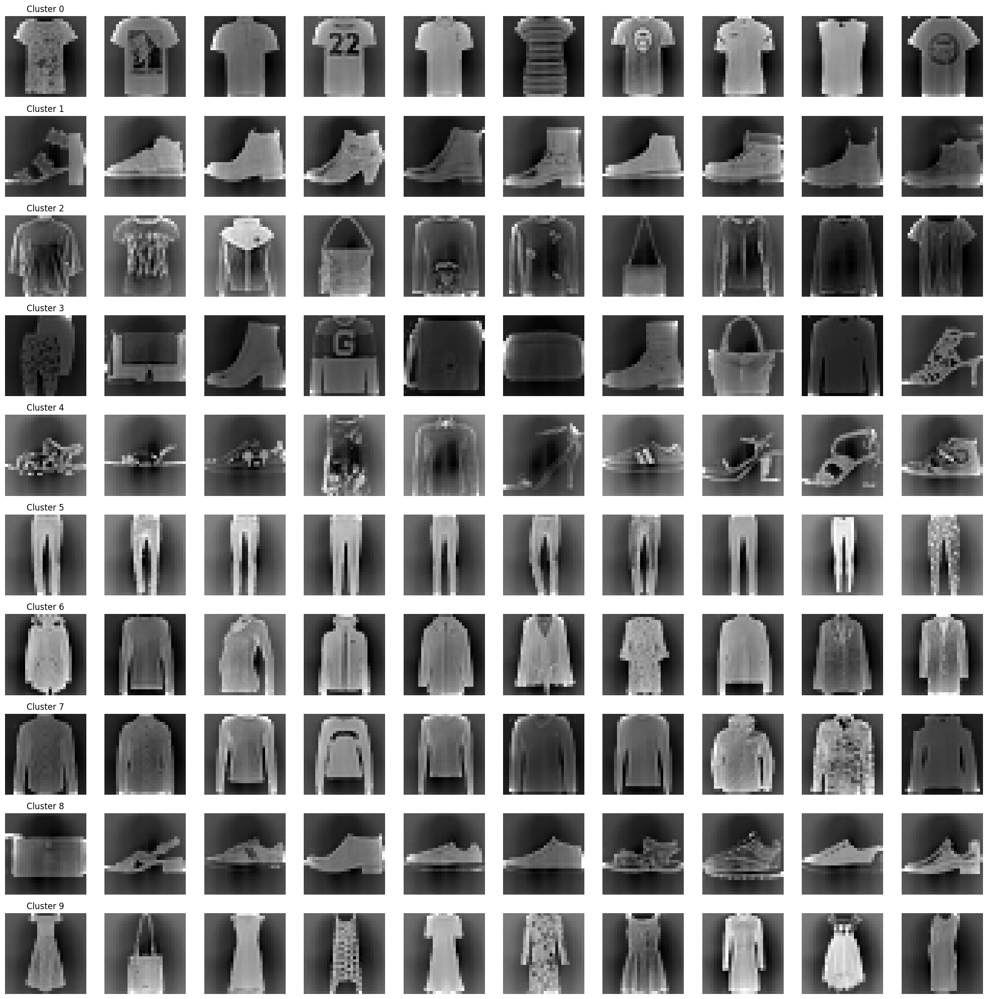

In [42]:
# Sample 10 elements from each cluster
cluster_samples = {}
for i in df_grouped.index:
	cluster_samples[i] = X_train_scaled_small[predicted_labels == i][:10]

# Plot the samples and put titles with the cluster number
fig = plt.figure(figsize=(20, 20))

for i in range(10):
	ax = fig.add_subplot(10, 10, i*10+1)
	ax.imshow(cluster_samples[i][0].reshape(28, 28), cmap='gray')
	ax.axis('off')
	ax.set_title(f'Cluster {i}')

	for j in range(1, 10):
		ax = fig.add_subplot(10, 10, i*10+j+1)
		ax.imshow(cluster_samples[i][j].reshape(28, 28), cmap='gray')
		ax.axis('off')

plt.tight_layout()
plt.show()

As we can see, there are some clusters that don't mirror one single class, for example for clusters 1, 2, 7. However, we can try and assign the true label manually to each cluster

In [43]:
fashion_mnist_classes

['T-shirt/top',
 'Trouser',
 'Pullover',
 'Dress',
 'Coat',
 'Sandal',
 'Shirt',
 'Sneaker',
 'Bag',
 'Ankle boot']

In [ ]:
manual_labels = np.array([0., 9., 3., 8., 5., 1., 4., 2., 7., 3.])

Test on this label assignment, however, will not be carried on, as it completely mirrors the `argmax` assignment.

## Section 5

In [45]:
X_train, X_val, y_train, y_val = train_test_split(X_train_scaled_small, y_train_small, test_size=0.2, random_state=42)

X_train_nn = th.tensor(np.array(X_train)).float()
y_train_nn = th.tensor(np.array(y_train)).long()
X_val_nn = th.tensor(np.array(X_val)).float()
y_val_nn = th.tensor(np.array(y_val)).long()

In [46]:
def train_svm(X_train, y_train, X_val, y_val, kernel='rbf', C=1.0, **kwargs):
    svm = SVC(kernel=kernel, C=C, **kwargs)
    svm.fit(X_train, y_train)
    accuracy_train = svm.score(X_train, y_train)
    y_pred = svm.predict(X_val)
    acc_value = accuracy_score(y_val, y_pred)
    return svm, accuracy_train, acc_value

best_svm, train_accuracy_svm, val_accuracy_svm = train_svm(X_train, y_train, X_val, y_val, kernel='rbf', C=1.0, gamma=30**(-2))
print(f"Best SVM with RBF kernel, C=1.0, gamma=30**(-2), Accuracy Train: {train_accuracy_svm:.4f}, Accuracy Val: {val_accuracy_svm:.4f}")

Best SVM with RBF kernel, C=1.0, gamma=30**(-2), Accuracy Train: 0.9079, Accuracy Val: 0.8033


In [47]:
train_dataset = TensorDataset(X_train_nn, y_train_nn)
val_dataset = TensorDataset(X_val_nn, y_val_nn)

nn_train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
nn_val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

nn1 = FCNN(hidden_size=128, hidden_layers=2).to(DEVICE)
nn2 = FCNN(hidden_size=256, hidden_layers=2).to(DEVICE)
cnn = CNN().to(DEVICE)

print("\nTraining FCNN 1")
nn1, train_accuracy_1, val_accuracy_1, train_losses_1, val_losses_1 = train_model(nn1, nn_train_loader, nn_val_loader, lr=1e-3, device=DEVICE)

print("\nTraining FCNN 2")
nn2, train_accuracy_2, val_accuracy_2, train_losses_2, val_losses_2 = train_model(nn2, nn_train_loader, nn_val_loader, lr=5e-4, device=DEVICE)

print("\nTraining CNN")
cnn, train_accuracy_cnn, val_accuracy_cnn, train_losses_cnn, val_losses_cnn = train_model(cnn, nn_train_loader, nn_val_loader, lr=1e-3, device=DEVICE)


Training FCNN 1
Epoch 1, Training Loss: 41.07678842544556, Training Accuracy: 0.6575, Validation Accuracy: 0.7283
Epoch 2, Training Loss: 20.281496822834015, Training Accuracy: 0.8000, Validation Accuracy: 0.7533
Epoch 3, Training Loss: 15.262501269578934, Training Accuracy: 0.8538, Validation Accuracy: 0.8067
Epoch 4, Training Loss: 12.207646980881691, Training Accuracy: 0.8825, Validation Accuracy: 0.8000
Epoch 5, Training Loss: 11.444618672132492, Training Accuracy: 0.8950, Validation Accuracy: 0.8050
Epoch 6, Training Loss: 9.826481491327286, Training Accuracy: 0.9079, Validation Accuracy: 0.8000
Epoch 7, Training Loss: 8.31315778195858, Training Accuracy: 0.9204, Validation Accuracy: 0.8067
Epoch 8, Training Loss: 7.387613579630852, Training Accuracy: 0.9287, Validation Accuracy: 0.8083
Epoch 9, Training Loss: 6.371379315853119, Training Accuracy: 0.9396, Validation Accuracy: 0.8117
Epoch 10, Training Loss: 5.489570714533329, Training Accuracy: 0.9492, Validation Accuracy: 0.8033

In [48]:
X_test_nn = th.tensor(np.array(X_test)).float()
y_test_nn = th.tensor(np.array(y_test)).long()

def evaluate_model(model, X_test, y_test):
	model.eval()
	with th.no_grad():
		output = model(X_test)
		_, predicted = th.max(output.data, 1)
		predicted = predicted.cpu()
		accuracy = accuracy_score(predicted, y_test)
		report = classification_report(y_test, predicted, target_names=fashion_mnist_classes, zero_division=0)
	return accuracy, report

In [49]:
svm_accuracy = accuracy_score(best_svm.predict(X_test_scaled), y_test)
svm_report = classification_report(y_test, best_svm.predict(X_test_scaled), target_names=fashion_mnist_classes, zero_division=0)

nn1_accuracy, nn1_report = evaluate_model(nn1, X_test_nn.to(DEVICE), y_test_nn)
nn2_accuracy, nn2_report = evaluate_model(nn2, X_test_nn.to(DEVICE), y_test_nn)
cnn_accuracy, cnn_report = evaluate_model(cnn, X_test_nn.to(DEVICE), y_test_nn)

print(f"SVM Accuracy: {svm_accuracy:.4f}")
print("\nClassification Report for SVM")
print(svm_report)

print(f"\n\nFCNN 1 Accuracy: {nn1_accuracy:.4f}")
print("\nClassification Report for FCNN 1")
print(nn1_report)

print(f"\n\nFCNN 2 Accuracy: {nn2_accuracy:.4f}")
print("\nClassification Report for FCNN 2")
print(nn2_report)

print(f"\n\nCNN Accuracy: {cnn_accuracy:.4f}")
print("\nClassification Report for CNN")
print(cnn_report)

SVM Accuracy: 0.8136

Classification Report for SVM
              precision    recall  f1-score   support

 T-shirt/top       0.74      0.79      0.77      1000
     Trouser       0.99      0.93      0.96      1000
    Pullover       0.73      0.70      0.71      1000
       Dress       0.77      0.88      0.82      1000
        Coat       0.74      0.70      0.72      1000
      Sandal       0.90      0.90      0.90      1000
       Shirt       0.57      0.51      0.54      1000
     Sneaker       0.89      0.88      0.89      1000
         Bag       0.90      0.94      0.92      1000
  Ankle boot       0.89      0.91      0.90      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



FCNN 1 Accuracy: 0.5971

Classification Report for FCNN 1
              precision    recall  f1-score   support

 T-shirt/top       0.69      0.77      0.73      1000
     Trouser       1

#### Some comments

We can observe as in general, the fully supervised approach by far outperforms the *hybrid* pipeline. In particular we can see how also in the fully supervised model, the kernel-SVM by far outperforms all the NN archietecture. This can be due to different facts, as before:
- For such simple datasets, above all with these few sample data, simpler models like SVMs perform highly better.
- To fully exploit the NN power, we should either use the full $60000$ samples dataset, in order to explot more data and let the Networks capture all the features of teh various classes, or to train them on more epochs, but with the risk of incurring in overfitting.
- In this context we are training the NNs on the scaled dataset: this fact can impact deeply the training process, as in general the NNs don't require preprocessing of data, as during training, above all when speaking about deep archietectures, the Network is able to **learn** on his own all the scaling and mapping necessary to achieve the lowest loss value.

### Training NNs on not-scaled dataset

In [50]:
X_train_nn, X_val_nn, y_train_nn, y_val_nn = train_test_split(X_train_small, y_train_small, test_size=0.2, random_state=42)

X_train_nn = th.tensor(np.array(X_train_nn)).float()
y_train_nn = th.tensor(np.array(y_train_nn)).long()
X_val_nn = th.tensor(np.array(X_val_nn)).float()
y_val_nn = th.tensor(np.array(y_val_nn)).long()

In [51]:
train_dataset = TensorDataset(X_train_nn, y_train_nn)
val_dataset = TensorDataset(X_val_nn, y_val_nn)

nn_train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
nn_val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

nn1 = FCNN(hidden_size=128, hidden_layers=2).to(DEVICE)
nn2 = FCNN(hidden_size=256, hidden_layers=2).to(DEVICE)
cnn = CNN().to(DEVICE)

print("\nTraining FCNN 1")
nn1, train_accuracy_1, val_accuracy_1, train_losses_1, val_losses_1 = train_model(nn1, nn_train_loader, nn_val_loader, lr=1e-3, device=DEVICE)

print("\nTraining FCNN 2")
nn2, train_accuracy_2, val_accuracy_2, train_losses_2, val_losses_2 = train_model(nn2, nn_train_loader, nn_val_loader, lr=5e-4, device=DEVICE)

print("\nTraining CNN")
cnn, train_accuracy_cnn, val_accuracy_cnn, train_losses_cnn, val_losses_cnn = train_model(cnn, nn_train_loader, nn_val_loader, lr=1e-3, device=DEVICE)


Training FCNN 1
Epoch 1, Training Loss: 56.37388104200363, Training Accuracy: 0.5017, Validation Accuracy: 0.6633
Epoch 2, Training Loss: 28.4047229886055, Training Accuracy: 0.7142, Validation Accuracy: 0.7067
Epoch 3, Training Loss: 23.85041955113411, Training Accuracy: 0.7750, Validation Accuracy: 0.7550
Epoch 4, Training Loss: 20.929346084594727, Training Accuracy: 0.8046, Validation Accuracy: 0.7600
Epoch 5, Training Loss: 18.717589765787125, Training Accuracy: 0.8258, Validation Accuracy: 0.7717
Epoch 6, Training Loss: 16.993538975715637, Training Accuracy: 0.8438, Validation Accuracy: 0.7767
Epoch 7, Training Loss: 16.03487315773964, Training Accuracy: 0.8592, Validation Accuracy: 0.7567
Epoch 8, Training Loss: 14.801050186157227, Training Accuracy: 0.8667, Validation Accuracy: 0.8033
Epoch 9, Training Loss: 14.222481027245522, Training Accuracy: 0.8712, Validation Accuracy: 0.8017
Epoch 10, Training Loss: 14.309284627437592, Training Accuracy: 0.8704, Validation Accuracy: 0.77

In [52]:
svm_accuracy = accuracy_score(best_svm.predict(X_test_scaled), y_test)
svm_report = classification_report(y_test, best_svm.predict(X_test_scaled), target_names=fashion_mnist_classes, zero_division=0)

nn1_accuracy, nn1_report = evaluate_model(nn1, X_test_nn.to(DEVICE), y_test_nn)
nn2_accuracy, nn2_report = evaluate_model(nn2, X_test_nn.to(DEVICE), y_test_nn)
cnn_accuracy, cnn_report = evaluate_model(cnn, X_test_nn.to(DEVICE), y_test_nn)

print(f"SVM Accuracy: {svm_accuracy:.4f}")
print("\nClassification Report for SVM")
print(svm_report)

print(f"\n\nFCNN 1 Accuracy: {nn1_accuracy:.4f}")
print("\nClassification Report for FCNN 1")
print(nn1_report)

print(f"\n\nFCNN 2 Accuracy: {nn2_accuracy:.4f}")
print("\nClassification Report for FCNN 2")
print(nn2_report)

print(f"\n\nCNN Accuracy: {cnn_accuracy:.4f}")
print("\nClassification Report for CNN")
print(cnn_report)

SVM Accuracy: 0.8136

Classification Report for SVM
              precision    recall  f1-score   support

 T-shirt/top       0.74      0.79      0.77      1000
     Trouser       0.99      0.93      0.96      1000
    Pullover       0.73      0.70      0.71      1000
       Dress       0.77      0.88      0.82      1000
        Coat       0.74      0.70      0.72      1000
      Sandal       0.90      0.90      0.90      1000
       Shirt       0.57      0.51      0.54      1000
     Sneaker       0.89      0.88      0.89      1000
         Bag       0.90      0.94      0.92      1000
  Ankle boot       0.89      0.91      0.90      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



FCNN 1 Accuracy: 0.8288

Classification Report for FCNN 1
              precision    recall  f1-score   support

 T-shirt/top       0.80      0.76      0.78      1000
     Trouser       0

We can see, as previously announced, that not preprocessing the data before feeding them into the networks, they are able to efficiently learn the proper scaling and feature map to maximize the accuracy (minimize the loss).
In this way, we are able to reach similar performance to the kernel-SVM with simple fully connected Neural Network, while we are able to outperform them using a CNN archietecture, reaching almost 86% of accuracy.